In [1]:
import os
import glob
import json
import numpy as np
import pandas as pd
from pathlib import Path
from PNW_cmap import PNW_cmap
import matplotlib.pyplot as plt
from vip_slap2_analysis.utils.utils import save_figure
from vip_slap2_analysis.io.session_registry import VIPSessionRegistry
from vip_slap2_analysis.glutamate.summary import GlutamateSummary
from vip_slap2_analysis.utils.utils import normalize
from scipy.signal import find_peaks

import seaborn as sns
sns.set_style('white')
params = {'legend.fontsize': 'x-large',
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
%load_ext autoreload
%autoreload 2

%matplotlib notebook

In [3]:
savepath = r'C:\Users\andrew.shelton\Dropbox\allen institute\Documents\Presentations\OPhys\Data_Club\April2026\figures'

In [4]:
target_mice = [
    803496,
    804730,804733,810196,
    809047,803121,
    826033,838410,834788
]

registry = VIPSessionRegistry.from_basepath(
    r'\\allen\aind\scratch\ophys\Andrew\VIP_synaptic_dynamics'
)

process_df = registry.sessions(
    subject_ids=target_mice,
    exclude_session_types=["expression_check", "volume_imaging"],
    paradigms=["change_detection_passive"],
)

assets = [registry.resolve_assets(row) for _, row in process_df.iterrows()]

print(f"Loaded {len(assets)} session assets")

Loaded 56 session assets


In [5]:
seq_sums = []
seq_pars = []
seq_pos = []
for asset in assets:
    try:
        print(asset.session_id)
        derived_dir = asset.derived_dir / 'glutamate' /'glutamate_analysis'
        seq_sum = pd.read_csv(os.path.join(derived_dir, 'sequence_summary_table.csv'))
        seq_sum['dmd1_depth'] = [asset.metadata['dmd1_depth']]*len(seq_sum)
        seq_sum['dmd2_depth'] = [asset.metadata['dmd2_depth']]*len(seq_sum)
        seq_par = pd.read_parquet(derived_dir / 'sequence_per_image_table.parquet')
        seq_pos_ = pd.read_parquet(derived_dir / 'sequence_position_table.parquet')
        seq_sums.append(seq_sum)

        seq_pars.append(seq_par)
        seq_pos.append(seq_pos_)
    except:
        pass

seq_summary = pd.concat(seq_sums)
seq_per_image = pd.concat(seq_pars)
seq_position = pd.concat(seq_pos)

803496_2025-07-25_13-02-10
803496_2025-07-28_08-04-39
803496_2025-07-29_13-34-35
803496_2025-07-30_10-05-23
803496_2025-07-31_09-43-28
803496_2025-08-01_13-22-49
804730_2025-07-25_14-08-35
804730_2025-07-28_13-57-34
804730_2025-07-29_14-55-04
804730_2025-07-30_11-11-11
804730_2025-07-31_11-45-27
804730_2025-08-01_14-22-38
804733_2025-07-25_15-17-00
804733_2025-07-28_19-00-06
804733_2025-07-29_16-02-24
804733_2025-07-30_12-59-44
804733_2025-07-31_13-29-01
804733_2025-08-01_15-20-32
810196_2025-07-25_16-24-20
810196_2025-07-28_19-59-05
810196_2025-07-29_17-02-41
810196_2025-07-31_08-28-08
810196_2025-07-31_14-19-46
810196_2025-08-01_16-37-27
809047_2025-10-29_10-16-32
809047_2025-10-30_10-06-43
809047_2025-10-31_12-00-50
809047_2025-11-01_17-51-59
809047_2025-11-05_10-13-00
809047_2025-11-06_11-05-31
803121_2025-10-29_11-19-29
803121_2025-10-30_11-13-32
803121_2025-10-31_13-05-26
803121_2025-11-01_19-00-21
803121_2025-11-05_11-16-57
803121_2025-11-06_12-12-23
826033_2026-02-21_09-23-34
8

C:\Users\andrew.shelton\AppData\Local\Temp\ipykernel_22520\3161649996.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  seq_summary = pd.concat(seq_sums)


In [6]:
act_path = r"C:\Users\andrew.shelton\Dropbox\allen institute\Documents\Presentations\OPhys\Data_Club\April2026\data\activation_summary.csv"
activation_summary = pd.read_csv(act_path)

In [7]:
seq_paths = [glob.glob(os.path.join(asset.derived_dir,'**','glutamate_sequence_df.npz'),recursive=True)[0] for asset in assets]

In [8]:
# --- Build a per-synapse preferred-image table and attach metadata + seq_path ---

# session metadata from process_df
session_meta = process_df.copy()

keep_cols = [c for c in ["session_id", "subject_id", "session_type", "session_order", "session_number"] if c in session_meta.columns]
if keep_cols:
    session_meta = session_meta[keep_cols].drop_duplicates().copy()
else:
    session_meta = pd.DataFrame({"session_id": process_df["session_id"].astype(str).unique()})

session_meta["session_id"] = session_meta["session_id"].astype(str)

if "subject_id" not in session_meta.columns:
    session_meta = session_meta.merge(
        seq_summary[["session_id", "subject_id"]].drop_duplicates(),
        on="session_id",
        how="left",
    )

if "session_order" not in session_meta.columns:
    if "session_number" in session_meta.columns:
        session_meta = session_meta.rename(columns={"session_number": "session_order"})
    else:
        session_meta["session_dt"] = pd.to_datetime(
            session_meta["session_id"]
            .str.extract(r"_(\d{4}-\d{2}-\d{2})_(\d{2}-\d{2}-\d{2})")
            .agg(" ".join, axis=1),
            format="%Y-%m-%d %H-%M-%S",
            errors="coerce",
        )
        session_meta = session_meta.sort_values(["subject_id", "session_dt", "session_id"]).copy()
        session_meta["session_order"] = session_meta.groupby("subject_id").cumcount() + 1
        session_meta = session_meta.drop(columns=["session_dt"])

# dmd depth lookup from seq_summary
depth_lookup = (
    seq_summary[["session_id", "subject_id", "dmd", "dmd1_depth", "dmd2_depth"]]
    .drop_duplicates()
    .copy()
)
depth_lookup["session_id"] = depth_lookup["session_id"].astype(str)
depth_lookup["dmd"] = depth_lookup["dmd"].astype(str)

depth_lookup["depth"] = np.where(
    depth_lookup["dmd"].eq("DMD1"),
    depth_lookup["dmd1_depth"],
    depth_lookup["dmd2_depth"],
)
depth_lookup = depth_lookup[["session_id", "subject_id", "dmd", "depth"]]

# choose the preferred image for each synapse from the per-image sequence summary
# based directly on maximum response amplitude, not rank_basis
pref = seq_per_image.copy()
pref["session_id"] = pref["session_id"].astype(str)
pref["dmd"] = pref["dmd"].astype(str)
pref["synapse_id"] = pref["synapse_id"].astype(str)

syn_keys = ["session_id", "subject_id", "dmd", "synapse_id"]

# pick the amplitude metric used to define the preferred image
if "r0" in pref.columns:
    amplitude_col = "r0"
elif "early_mean" in pref.columns:
    amplitude_col = "early_mean"
elif "ranking_score" in pref.columns:
    amplitude_col = "ranking_score"
else:
    raise ValueError(
        "Could not find an amplitude-like column to define preferred image. "
        "Expected one of: 'r0', 'early_mean', 'ranking_score'."
    )

pref_for_choice = pref.copy()
pref_for_choice[amplitude_col] = pd.to_numeric(pref_for_choice[amplitude_col], errors="coerce")

# keep only rows with a finite amplitude metric
pref_for_choice = pref_for_choice.loc[np.isfinite(pref_for_choice[amplitude_col])].copy()

# CRITICAL FIX: reset index so idxmax returns unique row labels
pref_for_choice = pref_for_choice.reset_index(drop=True)

# choose image with largest amplitude for each synapse
idx = pref_for_choice.groupby(syn_keys, dropna=False)[amplitude_col].idxmax()
preferred_rows = pref_for_choice.loc[idx].copy()

preferred_rows["preferred_image_metric"] = amplitude_col
preferred_rows["preferred_image_value"] = preferred_rows[amplitude_col]

# attach depth + session metadata
preferred_rows = (
    preferred_rows
    .merge(depth_lookup, on=["session_id", "subject_id", "dmd"], how="left")
    .merge(session_meta, on=["session_id", "subject_id"], how="left")
)

# map each session_id to its glutamate_sequence_df.npz path
seq_path_rows = []
for p in seq_paths:
    try:
        root = np.load(p, allow_pickle=True)["data"].item()
        seq_path_rows.append(
            {
                "session_id": str(root["metadata"]["session_id"]),
                "seq_path": str(p),
            }
        )
    except Exception:
        pass

seq_path_lookup = pd.DataFrame(seq_path_rows).drop_duplicates(subset=["session_id"])

preferred_rows = preferred_rows.merge(seq_path_lookup, on="session_id", how="left")

# Optional safety check
preferred_rows = preferred_rows.drop_duplicates(subset=syn_keys).copy()

print(f"Preferred image metric: {amplitude_col}")
print(f"{len(preferred_rows)} preferred synapse-image rows")
print("Unique synapses in seq_per_image:", pref[syn_keys].drop_duplicates().shape[0])
print("Unique synapses in preferred_rows:", preferred_rows[syn_keys].drop_duplicates().shape[0])
print("Unique synapses in preferred_rows with seq_path:",
      preferred_rows.loc[preferred_rows['seq_path'].notna(), syn_keys].drop_duplicates().shape[0])

display(preferred_rows.head())

Preferred image metric: r0
2658 preferred synapse-image rows
Unique synapses in seq_per_image: 2658
Unique synapses in preferred_rows: 2658
Unique synapses in preferred_rows with seq_path: 2658


,session_id,subject_id,dmd,synapse_id,stimulus_name,stimulus_label,n_positions,n_sequences,r0,rlast,...,ranking_score,image_rank_within_synapse,rank_basis,is_preferred_ranked_image,preferred_image_metric,preferred_image_value,depth,session_type,session_order,seq_path
0,803121_2025-10-29_11-19-29,803121,DMD1,DMD1_syn0000,stimuli\images_A\imk00942.tiff,imk00942,16,39,131.445340,165.070581,...,2205.252556,1,response_amplitude,True,r0,131.445340,200.0,familiar,1,\\allen\aind\scratch\ophys\Andrew\VIP_synaptic...
1,803121_2025-10-29_11-19-29,803121,DMD1,DMD1_syn0006,stimuli\images_A\imk01643.tiff,imk01643,14,39,60.473391,188.221606,...,713.755475,1,response_amplitude,True,r0,60.473391,200.0,familiar,1,\\allen\aind\scratch\ophys\Andrew\VIP_synaptic...
2,803121_2025-10-29_11-19-29,803121,DMD1,DMD1_syn0007,stimuli\images_A\imk00942.tiff,imk00942,16,39,333.875162,191.076353,...,879.518433,2,selectivity_score,False,r0,333.875162,200.0,familiar,1,\\allen\aind\scratch\ophys\Andrew\VIP_synaptic...
3,803121_2025-10-29_11-19-29,803121,DMD1,DMD1_syn0010,stimuli\images_A\imk01097.tiff,imk01097,19,38,29.041866,166.857010,...,207.718990,4,response_amplitude,False,r0,29.041866,200.0,familiar,1,\\allen\aind\scratch\ophys\Andrew\VIP_synaptic...
4,803121_2025-10-29_11-19-29,803121,DMD1,DMD1_syn0011,stimuli\images_A\imk00459.tiff,imk00459,19,38,210.599481,209.248983,...,2569.974754,1,response_amplitude,True,r0,210.599481,200.0,familiar,1,\\allen\aind\scratch\ophys\Andrew\VIP_synaptic...


In [9]:
# --- Extract concatenated repeated-sequence traces for each preferred image/synapse (faster grouped version) ---

MAX_PRESENTATIONS = 10

seq_cache = {}

def load_sequence_root(path):
    path = str(path)
    if path not in seq_cache:
        seq_cache[path] = np.load(path, allow_pickle=True)["data"].item()
    return seq_cache[path]

trace_rows = []
trace_vectors = []

# keep only rows with a valid seq_path
pref_valid = preferred_rows.loc[preferred_rows["seq_path"].notna()].copy()

print(f"Extracting traces for {len(pref_valid)} preferred rows")

for (seq_path, dmd), grp in pref_valid.groupby(["seq_path", "dmd"], sort=False):
    seq_path = str(seq_path)
    dmd = str(dmd)

    try:
        root = load_sequence_root(seq_path)
        dmd_block = root[dmd]

        synapse_ids = np.asarray(dmd_block["synapse_ids"]).astype(str)
        synapse_idx_lookup = {sid: i for i, sid in enumerate(synapse_ids)}

        image_identity = dmd_block["image_identity"]

        print(f"{grp['session_id'].iloc[0]} | {dmd} | n_synapses={len(grp)} | n_images={len(image_identity)}")

        for _, row in grp.iterrows():
            synapse_id = str(row["synapse_id"])
            stimulus_name = str(row["stimulus_name"])

            syn_idx = synapse_idx_lookup.get(synapse_id, None)
            if syn_idx is None:
                continue

            if stimulus_name not in image_identity:
                continue

            repeated = image_identity[stimulus_name]["repeated"]

            # shape: (n_positions, n_synapses, n_samples)
            repeated_mean = np.asarray(repeated["mean"], dtype=float)[:, syn_idx, :]
            repeated_counts = np.asarray(repeated["counts"], dtype=float)
            repeated_positions = np.asarray(repeated["positions"], dtype=int)

            # sort by true sequence position
            order = np.argsort(repeated_positions)
            repeated_mean = repeated_mean[order]
            repeated_counts = repeated_counts[order]
            repeated_positions = repeated_positions[order]

            n_positions_total, n_samples = repeated_mean.shape
            n_keep = min(MAX_PRESENTATIONS, n_positions_total)

            # clip/pad to fixed number of presentations
            clipped = np.full((MAX_PRESENTATIONS, n_samples), np.nan, dtype=float)
            clipped[:n_keep, :] = repeated_mean[:n_keep, :]

            counts_pad = np.full(MAX_PRESENTATIONS, np.nan, dtype=float)
            counts_pad[:n_keep] = repeated_counts[:n_keep]

            positions_pad = np.full(MAX_PRESENTATIONS, np.nan, dtype=float)
            positions_pad[:n_keep] = repeated_positions[:n_keep]

            trace_rows.append(
                {
                    "session_id": row["session_id"],
                    "subject_id": row["subject_id"],
                    "session_type": row.get("session_type", np.nan),
                    "session_order": row.get("session_order", np.nan),
                    "dmd": row["dmd"],
                    "depth": row.get("depth", np.nan),
                    "synapse_id": row["synapse_id"],
                    "stimulus_name": row["stimulus_name"],
                    "stimulus_label": row.get("stimulus_label", np.nan),
                    "preferred_image_metric": row.get("preferred_image_metric", np.nan),
                    "preferred_image_value": row.get("preferred_image_value", np.nan),
                    "n_positions_available": int(n_positions_total),
                    "n_positions_used": int(n_keep),
                    "samples_per_presentation": int(n_samples),
                    "seq_path": seq_path,
                }
            )

            trace_vectors.append(clipped.reshape(-1))

    except Exception as e:
        print(f"Skipping group {seq_path} | {dmd}: {e}")

if len(trace_vectors) == 0:
    raise RuntimeError("No preferred sequence traces were extracted.")

# assemble wide trace table for heatmap use
sequence_trace_meta = pd.DataFrame(trace_rows)

n_total_samples = trace_vectors[0].shape[0]
trace_cols = [f"trace_{i:04d}" for i in range(n_total_samples)]
sequence_trace_values = pd.DataFrame(np.vstack(trace_vectors), columns=trace_cols)

preferred_sequence_trace_table = pd.concat(
    [sequence_trace_meta.reset_index(drop=True), sequence_trace_values.reset_index(drop=True)],
    axis=1,
)

print("preferred_sequence_trace_table shape:", preferred_sequence_trace_table.shape)
print("unique synapses extracted:",
      preferred_sequence_trace_table[["session_id", "subject_id", "dmd", "synapse_id"]].drop_duplicates().shape[0])

display(preferred_sequence_trace_table.head())

Extracting traces for 2658 preferred rows
803121_2025-10-29_11-19-29 | DMD1 | n_synapses=16 | n_images=7
803121_2025-10-29_11-19-29 | DMD2 | n_synapses=17 | n_images=7
803121_2025-10-30_11-13-32 | DMD1 | n_synapses=44 | n_images=7
803121_2025-10-30_11-13-32 | DMD2 | n_synapses=34 | n_images=7
803121_2025-10-31_13-05-26 | DMD1 | n_synapses=60 | n_images=7
803121_2025-10-31_13-05-26 | DMD2 | n_synapses=35 | n_images=7
803121_2025-11-01_19-00-21 | DMD1 | n_synapses=22 | n_images=7
803121_2025-11-01_19-00-21 | DMD2 | n_synapses=83 | n_images=7
803121_2025-11-05_11-16-57 | DMD1 | n_synapses=81 | n_images=7
803121_2025-11-05_11-16-57 | DMD2 | n_synapses=43 | n_images=7
803121_2025-11-06_12-12-23 | DMD1 | n_synapses=17 | n_images=7
803496_2025-07-25_13-02-10 | DMD1 | n_synapses=47 | n_images=7
803496_2025-07-25_13-02-10 | DMD2 | n_synapses=34 | n_images=7
803496_2025-07-28_08-04-39 | DMD1 | n_synapses=3 | n_images=7
803496_2025-07-28_08-04-39 | DMD2 | n_synapses=1 | n_images=7
803496_2025-07-

,session_id,subject_id,session_type,session_order,dmd,depth,synapse_id,stimulus_name,stimulus_label,preferred_image_metric,...,trace_1490,trace_1491,trace_1492,trace_1493,trace_1494,trace_1495,trace_1496,trace_1497,trace_1498,trace_1499
0,803121_2025-10-29_11-19-29,803121,familiar,1,DMD1,200.0,DMD1_syn0000,stimuli\images_A\imk00942.tiff,imk00942,r0,...,-30.333655,12.333376,97.341571,100.826516,16.800065,28.428641,12.541819,-15.728805,11.886229,152.825915
1,803121_2025-10-29_11-19-29,803121,familiar,1,DMD1,200.0,DMD1_syn0006,stimuli\images_A\imk01643.tiff,imk01643,r0,...,158.229921,81.864181,23.537215,-6.218382,-28.058044,-95.504302,-96.627262,-47.252175,-24.637371,-23.685927
2,803121_2025-10-29_11-19-29,803121,familiar,1,DMD1,200.0,DMD1_syn0007,stimuli\images_A\imk00942.tiff,imk00942,r0,...,20.613539,16.408180,-15.914488,0.773525,109.471100,225.953310,170.393244,63.987678,117.799571,114.705843
3,803121_2025-10-29_11-19-29,803121,familiar,1,DMD1,200.0,DMD1_syn0010,stimuli\images_A\imk01097.tiff,imk01097,r0,...,32.476368,27.919786,12.142968,-3.300767,-12.915781,-9.904594,1.664699,21.010844,36.178015,29.897988
4,803121_2025-10-29_11-19-29,803121,familiar,1,DMD1,200.0,DMD1_syn0011,stimuli\images_A\imk00459.tiff,imk00459,r0,...,4.558163,-51.334828,-50.896980,-10.295384,-15.809692,-36.236854,-13.271150,22.830241,18.943699,2.287761


In [10]:
# --- Build raw heatmap matrix + optional visualization transforms ---

trace_cols = [c for c in preferred_sequence_trace_table.columns if c.startswith("trace_")]
preferred_sequence_heatmap_raw = preferred_sequence_trace_table[trace_cols].to_numpy(dtype=float)

n_samples = int(preferred_sequence_trace_table["samples_per_presentation"].iloc[0])
n_presentations = int(preferred_sequence_heatmap_raw.shape[1] / n_samples)

def nan_zscore_rows(x):
    x = np.asarray(x, dtype=float)
    mu = np.nanmean(x, axis=1, keepdims=True)
    sd = np.nanstd(x, axis=1, keepdims=True)
    sd[sd == 0] = np.nan
    return (x - mu) / sd

def nan_robust_scale_rows(x):
    x = np.asarray(x, dtype=float)
    med = np.nanmedian(x, axis=1, keepdims=True)
    q25 = np.nanpercentile(x, 25, axis=1, keepdims=True)
    q75 = np.nanpercentile(x, 75, axis=1, keepdims=True)
    iqr = q75 - q25
    iqr[iqr == 0] = np.nan
    return (x - med) / iqr

def nan_minmax_rows(x):
    x = np.asarray(x, dtype=float)
    xmin = np.nanmin(x, axis=1, keepdims=True)
    xmax = np.nanmax(x, axis=1, keepdims=True)
    rng = xmax - xmin
    rng[rng == 0] = np.nan
    return (x - xmin) / rng

def baseline_subtract_per_presentation(x, n_samples, baseline_slice=(0, 50)):
    """
    Subtract the baseline mean separately within each presentation block.
    Assumes each block has n_samples columns.
    """
    x = np.asarray(x, dtype=float).copy()
    n_rows, total_samples = x.shape
    n_presentations = total_samples // n_samples

    out = np.full_like(x, np.nan, dtype=float)
    b0, b1 = baseline_slice

    for p in range(n_presentations):
        s0 = p * n_samples
        s1 = (p + 1) * n_samples
        block = x[:, s0:s1]
        baseline = np.nanmean(block[:, b0:b1], axis=1, keepdims=True)
        out[:, s0:s1] = block - baseline

    return out

def global_zscore(x):
    mu = np.nanmean(x)
    sd = np.nanstd(x)
    if not np.isfinite(sd) or sd == 0:
        return x * np.nan
    return (x - mu) / sd

def clip_by_quantiles(x, qlow=None, qhigh=None):
    x = np.asarray(x, dtype=float).copy()
    if qlow is None or qhigh is None:
        return x
    lo = np.nanpercentile(x, qlow)
    hi = np.nanpercentile(x, qhigh)
    return np.clip(x, lo, hi)

# -----------------------------
# Visualization settings
# -----------------------------
VIS_MODE = "row_zscore"
# options:
# "none"
# "row_zscore"
# "row_robust"
# "row_minmax"
# "baseline_subtract"
# "baseline_then_row_zscore"
# "baseline_then_row_robust"
# "global_zscore"

BASELINE_SLICE = (0, 50)     # baseline window within each presentation
CLIP_QUANTILES = None        # e.g. (1, 99) or None
CENTER_ZERO = True           # useful for z-scored / baseline-subtracted data

# -----------------------------
# Apply transform
# -----------------------------
preferred_sequence_heatmap_vis = preferred_sequence_heatmap_raw.copy()

if VIS_MODE == "none":
    pass
elif VIS_MODE == "row_zscore":
    preferred_sequence_heatmap_vis = nan_zscore_rows(preferred_sequence_heatmap_vis)
elif VIS_MODE == "row_robust":
    preferred_sequence_heatmap_vis = nan_robust_scale_rows(preferred_sequence_heatmap_vis)
elif VIS_MODE == "row_minmax":
    preferred_sequence_heatmap_vis = nan_minmax_rows(preferred_sequence_heatmap_vis)
elif VIS_MODE == "baseline_subtract":
    preferred_sequence_heatmap_vis = baseline_subtract_per_presentation(
        preferred_sequence_heatmap_vis,
        n_samples=n_samples,
        baseline_slice=BASELINE_SLICE,
    )
elif VIS_MODE == "baseline_then_row_zscore":
    preferred_sequence_heatmap_vis = baseline_subtract_per_presentation(
        preferred_sequence_heatmap_vis,
        n_samples=n_samples,
        baseline_slice=BASELINE_SLICE,
    )
    preferred_sequence_heatmap_vis = nan_zscore_rows(preferred_sequence_heatmap_vis)
elif VIS_MODE == "baseline_then_row_robust":
    preferred_sequence_heatmap_vis = baseline_subtract_per_presentation(
        preferred_sequence_heatmap_vis,
        n_samples=n_samples,
        baseline_slice=BASELINE_SLICE,
    )
    preferred_sequence_heatmap_vis = nan_robust_scale_rows(preferred_sequence_heatmap_vis)
elif VIS_MODE == "global_zscore":
    preferred_sequence_heatmap_vis = global_zscore(preferred_sequence_heatmap_vis)
else:
    raise ValueError(f"Unknown VIS_MODE: {VIS_MODE}")

preferred_sequence_heatmap_vis = clip_by_quantiles(
    preferred_sequence_heatmap_vis,
    qlow=None if CLIP_QUANTILES is None else CLIP_QUANTILES[0],
    qhigh=None if CLIP_QUANTILES is None else CLIP_QUANTILES[1],
)

print("Raw heatmap shape:", preferred_sequence_heatmap_raw.shape)
print("Visualization heatmap shape:", preferred_sequence_heatmap_vis.shape)
print("Samples per presentation:", n_samples)
print("Presentations:", n_presentations)
print("VIS_MODE:", VIS_MODE)
print("CLIP_QUANTILES:", CLIP_QUANTILES)

# Handy plotting defaults
if CENTER_ZERO:
    vlim = np.nanpercentile(np.abs(preferred_sequence_heatmap_vis), 99)
    heatmap_vmin, heatmap_vmax = -vlim, vlim
else:
    heatmap_vmin = np.nanpercentile(preferred_sequence_heatmap_vis, 1)
    heatmap_vmax = np.nanpercentile(preferred_sequence_heatmap_vis, 99)

print("Suggested vmin/vmax:", heatmap_vmin, heatmap_vmax)

Raw heatmap shape: (2658, 1500)
Visualization heatmap shape: (2658, 1500)
Samples per presentation: 150
Presentations: 10
VIS_MODE: row_zscore
CLIP_QUANTILES: None
Suggested vmin/vmax: -2.9414694638256615 2.9414694638256615


In [11]:
# --- Optional rolling-mean smoothing for visualization ---

APPLY_ROLLING_MEAN = True
ROLLING_MEAN_WINDOW = 20   # try 3, 5, 7, or 9
ROLLING_MEAN_CENTER = False
ROLLING_MIN_PERIODS = 1

preferred_sequence_heatmap_vis_smoothed = preferred_sequence_heatmap_vis.copy()

if APPLY_ROLLING_MEAN:
    preferred_sequence_heatmap_vis_smoothed = (
        pd.DataFrame(preferred_sequence_heatmap_vis_smoothed)
        .T
        .rolling(
            window=ROLLING_MEAN_WINDOW,
            center=ROLLING_MEAN_CENTER,
            min_periods=ROLLING_MIN_PERIODS,
        )
        .mean()
        .T
        .to_numpy()
    )

print("Rolling mean applied:", APPLY_ROLLING_MEAN)
print("Rolling window:", ROLLING_MEAN_WINDOW)
print("Centered:", ROLLING_MEAN_CENTER)
print("Smoothed heatmap shape:", preferred_sequence_heatmap_vis_smoothed.shape)

Rolling mean applied: True
Rolling window: 20
Centered: False
Smoothed heatmap shape: (2658, 1500)


In [12]:
# Sort rows by the mean of the last 100 samples of the smoothed visualization matrix

SORT_LAST_N = 100
ns = 50
tail_mean = np.nanmedian(preferred_sequence_heatmap_vis_smoothed[:, -SORT_LAST_N:-SORT_LAST_N+ns], axis=1)
sort_order = np.argsort(tail_mean)[::-1]

preferred_sequence_heatmap_vis_sorted = preferred_sequence_heatmap_vis_smoothed[sort_order, :]
preferred_sequence_heatmap_raw_sorted = preferred_sequence_heatmap_raw[sort_order, :]
preferred_sequence_trace_table_sorted = preferred_sequence_trace_table.iloc[sort_order].reset_index(drop=True)

print("Sorted heatmap shape:", preferred_sequence_heatmap_vis_sorted.shape)
display(preferred_sequence_trace_table_sorted.head())

Sorted heatmap shape: (2658, 1500)


,session_id,subject_id,session_type,session_order,dmd,depth,synapse_id,stimulus_name,stimulus_label,preferred_image_metric,...,trace_1490,trace_1491,trace_1492,trace_1493,trace_1494,trace_1495,trace_1496,trace_1497,trace_1498,trace_1499
0,810196_2025-07-28_19-59-05,810196,familiar,2,DMD1,25.0,DMD1_syn0004,stimuli\images_A\imk01057.tiff,imk01057,r0,...,229.929854,177.639977,210.712791,129.319675,27.752311,-2.239520,19.857100,69.388476,77.920351,112.140851
1,804733_2025-07-29_16-02-24,804733,familiar,3,DMD2,100.0,DMD2_syn0007,stimuli\images_A\imk01057.tiff,imk01057,r0,...,5.698678,3.624117,2.653531,3.166403,3.521658,4.449250,4.733827,3.535017,3.429189,5.213747
2,803496_2025-07-31_09-43-28,803496,novel+,5,DMD2,100.0,DMD2_syn0048,stimuli\images_B\216066.tiff,216066,r0,...,2.745352,5.864742,6.268733,5.146523,3.778419,2.684660,2.396250,1.280254,1.076483,2.082549
3,804733_2025-08-01_15-20-32,804733,novel+,6,DMD2,100.0,DMD2_syn0012,stimuli\images_B\imk01306.tiff,imk01306,r0,...,2.312800,2.590612,2.876559,3.610029,4.384688,7.853846,13.617003,17.470859,18.806116,13.276089
4,804733_2025-07-28_19-00-06,804733,familiar,2,DMD1,25.0,DMD1_syn0041,stimuli\images_A\imk00459.tiff,imk00459,r0,...,18.172457,14.286752,19.527815,13.006431,12.603418,19.098662,18.927252,15.176518,14.776456,16.903700


In [13]:
from PNW_cmap import PNW_cmap
cl,cmap,cp = PNW_cmap.get_PNW_cmap('Bay',n_colors=10)

<IPython.core.display.Javascript object>


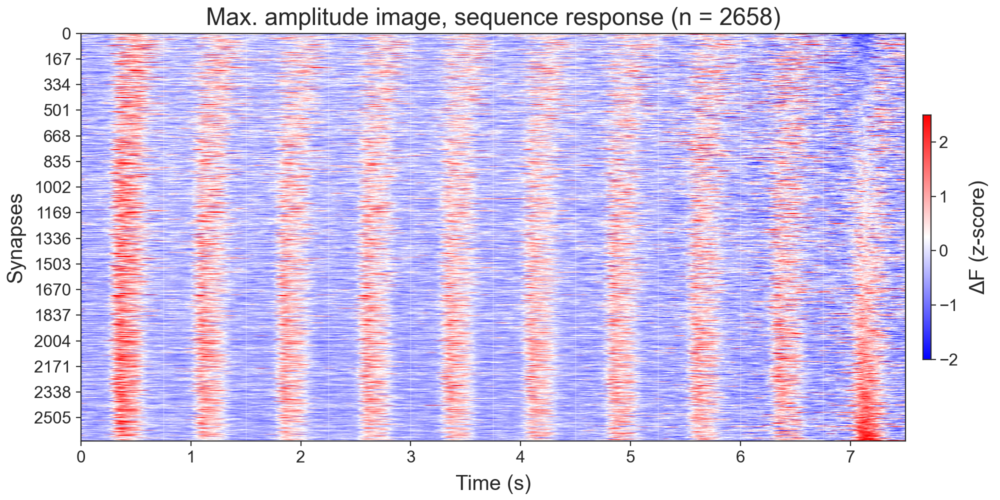

In [14]:
fs = 200  # Hz

# -----------------------
# plotting controls
# -----------------------
FIGSIZE = (10, 5)
VMIN = -2.0
VMAX = 2.5
CMAP = "bwr"

CBAR_LABEL = "\u0394F (z-score)"
CBAR_SHRINK = 0.6
CBAR_PAD = 0.02
CBAR_FRACTION = 0.05
CBAR_ASPECT = 30
CBAR_LABEL_SIZE = 15
CBAR_TICK_SIZE = 12

XLABEL = "Time (s)"
YLABEL = "Synapses"
AXIS_LABEL_SIZE = 15
TICK_LABEL_SIZE = 12

# choose x tick spacing in seconds
XTICK_STEP_S = 1.0

fig, ax = plt.subplots(figsize=FIGSIZE)

hm = sns.heatmap(
    preferred_sequence_heatmap_vis_sorted[::-1],
    ax=ax,
    cmap=CMAP,
    vmin=VMIN,
    vmax=VMAX,
    cbar_kws={
        "label": CBAR_LABEL,
        "shrink": CBAR_SHRINK,
        "pad": CBAR_PAD,
        "fraction": CBAR_FRACTION,
        "aspect": CBAR_ASPECT,
    },
)

# vertical separators between image presentations
for p in range(1, n_presentations):
    ax.axvline(p * n_samples, color="w", lw=0.5, alpha=0.4)

# x axis in seconds
n_total_samples = preferred_sequence_heatmap_vis_sorted.shape[1]
total_time_s = n_total_samples / fs

xticks_s = np.arange(0, total_time_s + 1e-9, XTICK_STEP_S)
xticks = xticks_s * fs

# heatmap pixels are centered on columns, so no +0.5 shift is usually needed here
ax.set_xticks(xticks)
ax.set_xticklabels([f"{x:.0f}" if XTICK_STEP_S >= 1 else f"{x:.1f}" for x in xticks_s])

# tighter labels / styling
ax.set_xlabel(XLABEL, fontsize=AXIS_LABEL_SIZE, labelpad=6)
ax.set_ylabel(YLABEL, fontsize=AXIS_LABEL_SIZE, labelpad=6)
ax.tick_params(axis='x', which='major', reset=True, top=False, labelsize=12)
ax.tick_params(axis='y', which='major', reset=True, right=False, labelsize=12)
ax.set_title(f'Max. amplitude image, sequence response (n = {len(preferred_sequence_heatmap_vis_sorted)})')
# colorbar formatting
cbar = hm.collections[0].colorbar
cbar.set_label(CBAR_LABEL, fontsize=CBAR_LABEL_SIZE, labelpad=8)
cbar.ax.tick_params(labelsize=CBAR_TICK_SIZE, pad=2)

sns.despine(left=False, bottom=False,top=False,right=False)
plt.tight_layout(pad=0.5)

filen = 'slope_heatmap'
save_figure(fig,os.path.join(savepath,filen),formats=['.png','.pdf'],dpi=100)

<IPython.core.display.Javascript object>


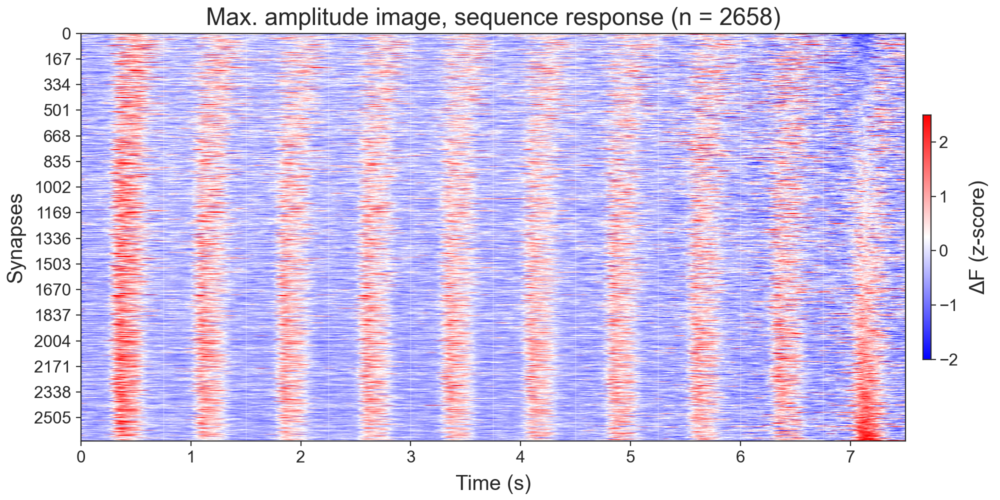

In [18]:
fs = 200  # Hz

fig, ax = plt.subplots(figsize=FIGSIZE)

hm = sns.heatmap(
    preferred_sequence_heatmap_vis_sorted[::-1],
    ax=ax,
    cmap=CMAP,
    vmin=VMIN,
    vmax=VMAX,
    cbar_kws={
        "label": CBAR_LABEL,
        "shrink": CBAR_SHRINK,
        "pad": CBAR_PAD,
        "fraction": CBAR_FRACTION,
        "aspect": CBAR_ASPECT,
    },
)

# Rasterize the actual heatmap artist for PDF/SVG/PS backends
hm.collections[0].set_rasterized(True)

# More efficient than many ax.axvline calls
xsep = np.arange(1, n_presentations) * n_samples
ax.vlines(
    xsep,
    ymin=0,
    ymax=preferred_sequence_heatmap_vis_sorted.shape[0],
    colors="w",
    linewidth=0.5,
    alpha=0.4,
)

n_total_samples = preferred_sequence_heatmap_vis_sorted.shape[1]
total_time_s = n_total_samples / fs

xticks_s = np.arange(0, total_time_s + 1e-9, XTICK_STEP_S)
xticks = xticks_s * fs
ax.set_xticks(xticks)
ax.set_xticklabels(
    [f"{x:.0f}" if XTICK_STEP_S >= 1 else f"{x:.1f}" for x in xticks_s]
)

ax.set_xlabel(XLABEL, fontsize=AXIS_LABEL_SIZE, labelpad=6)
ax.set_ylabel(YLABEL, fontsize=AXIS_LABEL_SIZE, labelpad=6)
ax.tick_params(axis='x', which='major', reset=True, top=False, labelsize=12)
ax.tick_params(axis='y', which='major', reset=True, right=False, labelsize=12)
ax.set_title(f"Max. amplitude image, sequence response (n = {len(preferred_sequence_heatmap_vis_sorted)})")

cbar = hm.collections[0].colorbar
cbar.set_label(CBAR_LABEL, fontsize=CBAR_LABEL_SIZE, labelpad=8)
cbar.ax.tick_params(labelsize=CBAR_TICK_SIZE, pad=2)

sns.despine(left=False, bottom=False, top=False, right=False)
plt.tight_layout(pad=0.5)

filen = "slope_heatmap"
save_figure(
    fig,
    os.path.join(savepath, filen),
    formats=[".png", ".pdf"],
    dpi=80,   # matters now because the heatmap is rasterized
)

<IPython.core.display.Javascript object>


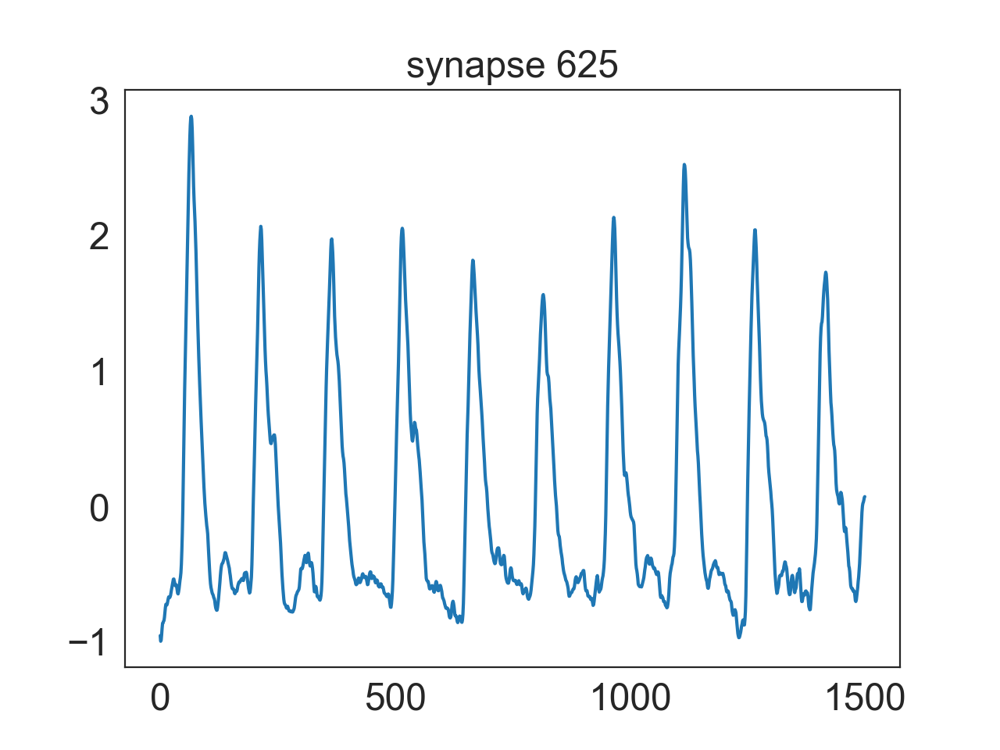

<IPython.core.display.Javascript object>


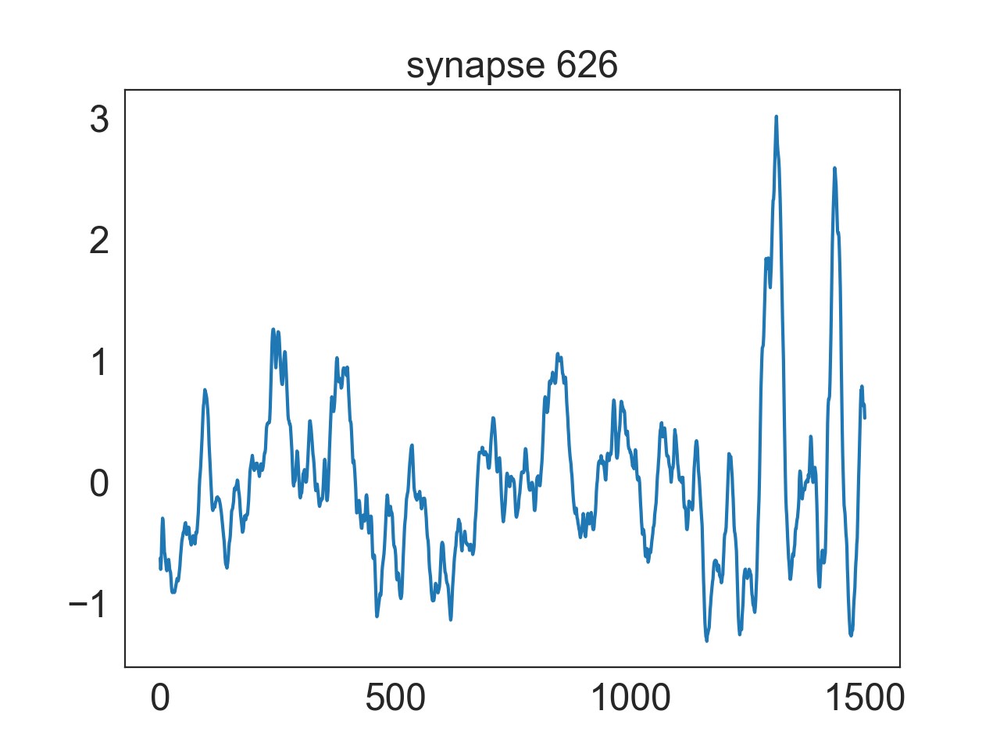

<IPython.core.display.Javascript object>


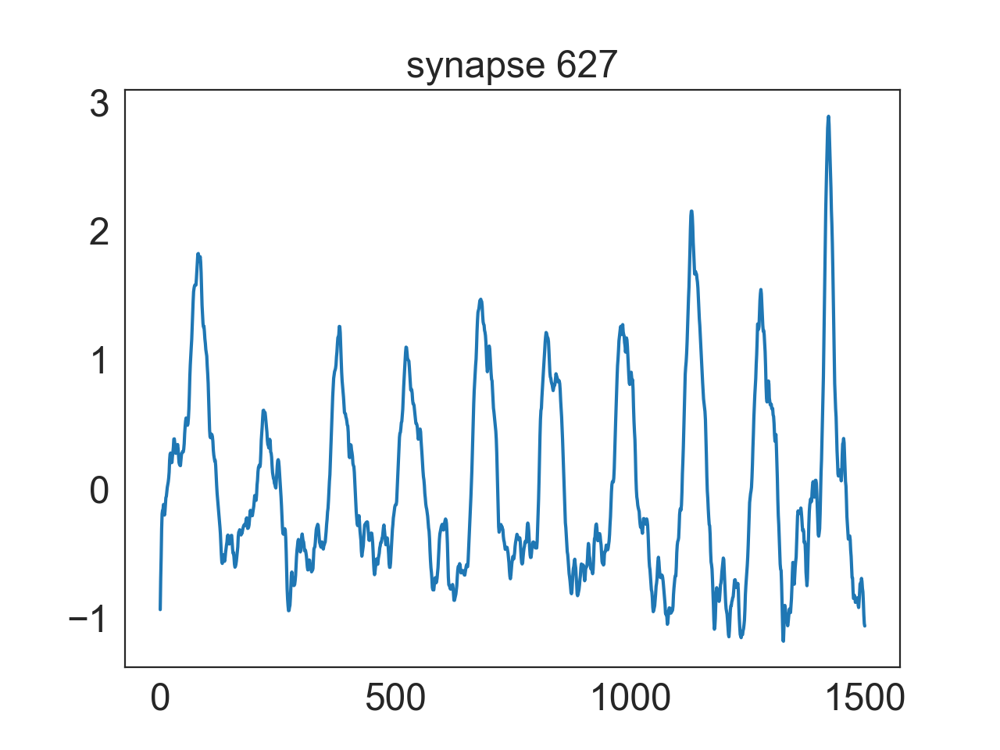

<IPython.core.display.Javascript object>


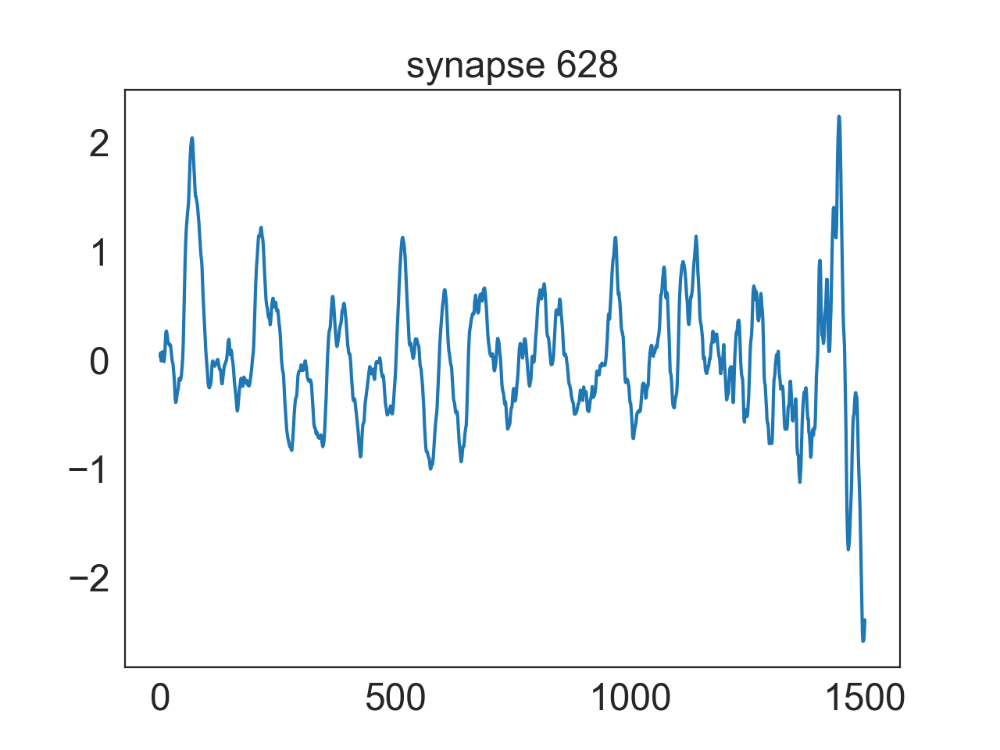

<IPython.core.display.Javascript object>


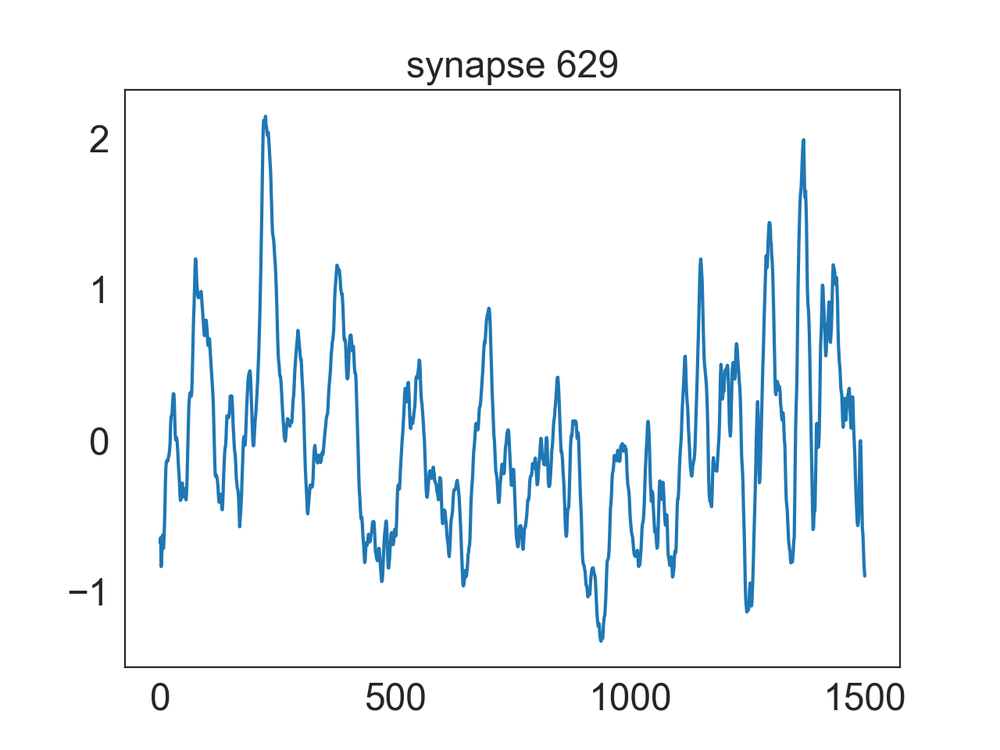

<IPython.core.display.Javascript object>


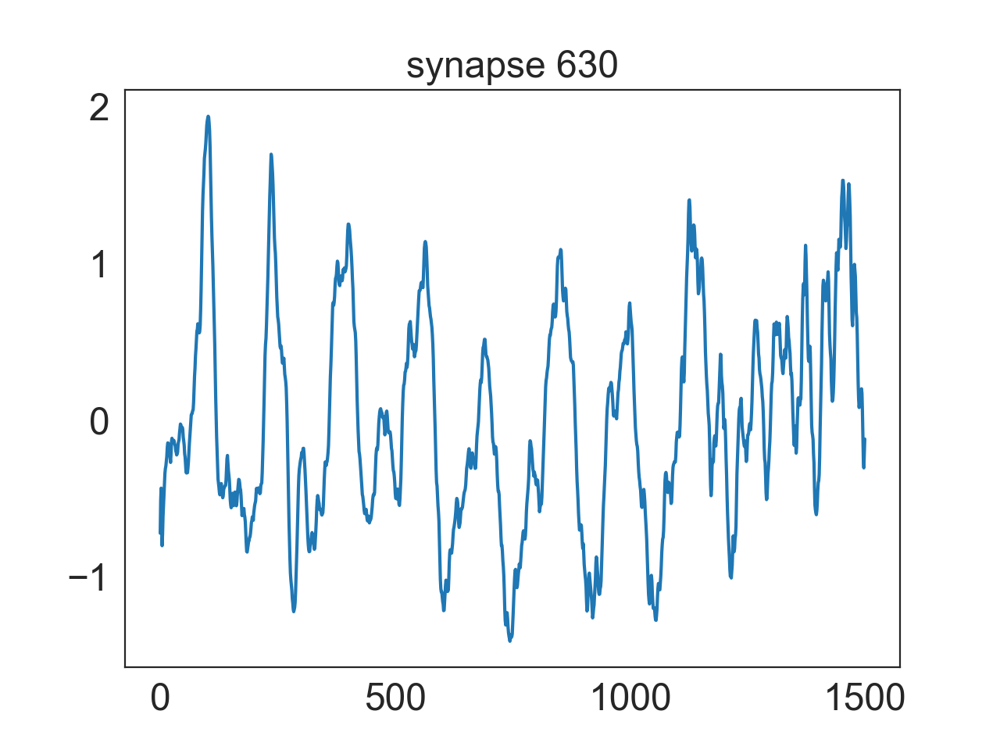

<IPython.core.display.Javascript object>


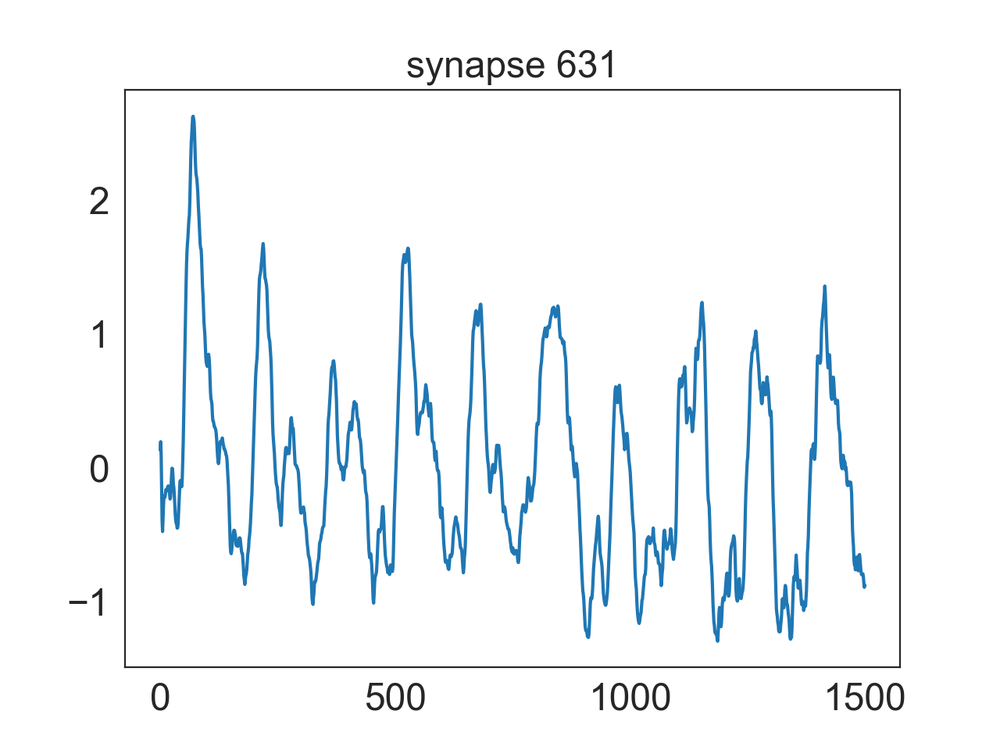

<IPython.core.display.Javascript object>


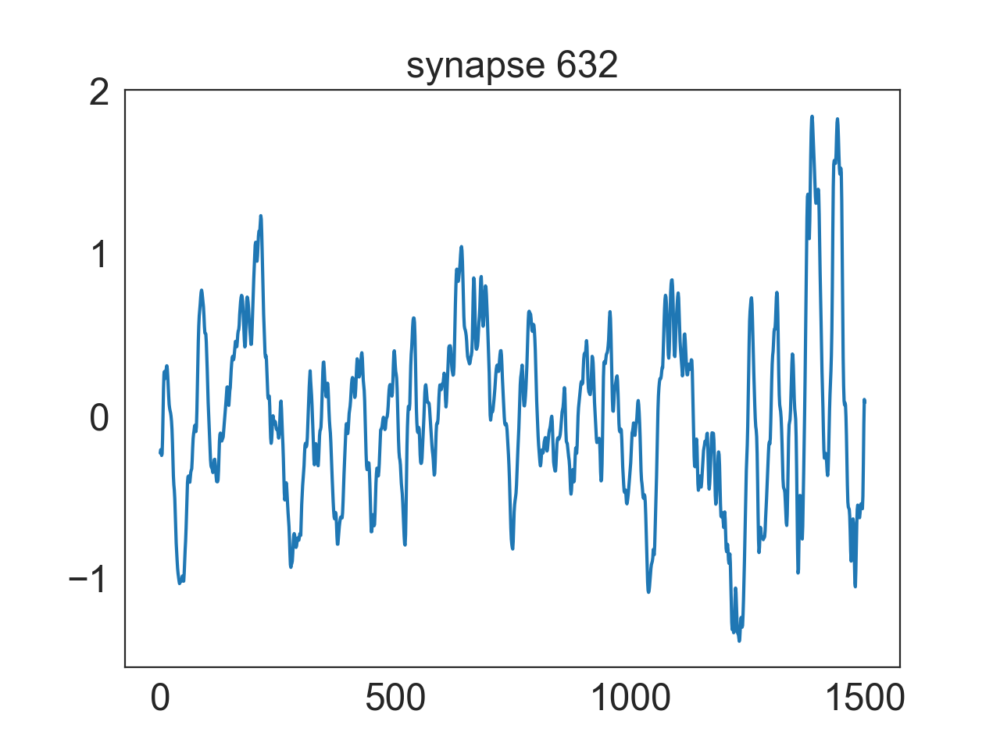

<IPython.core.display.Javascript object>


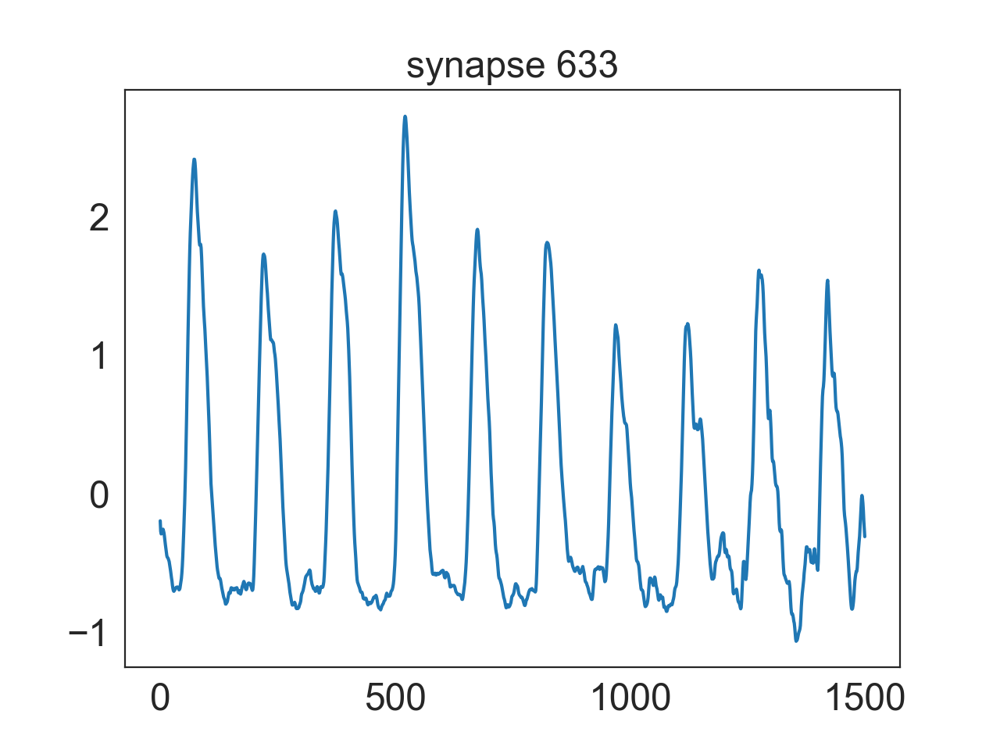

<IPython.core.display.Javascript object>


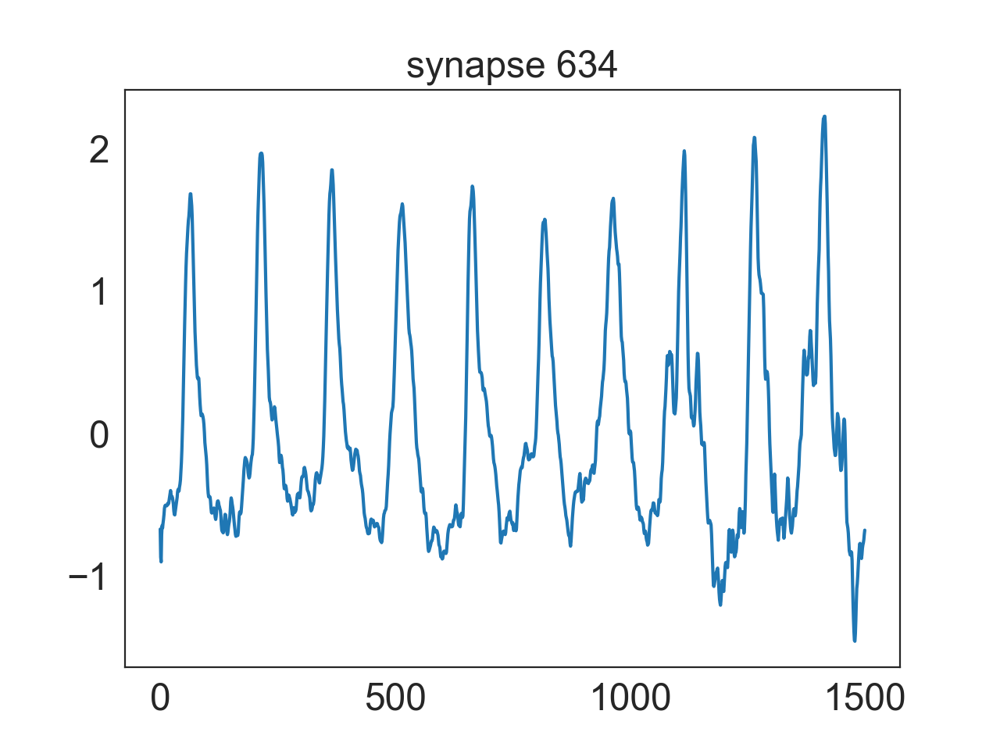

<IPython.core.display.Javascript object>


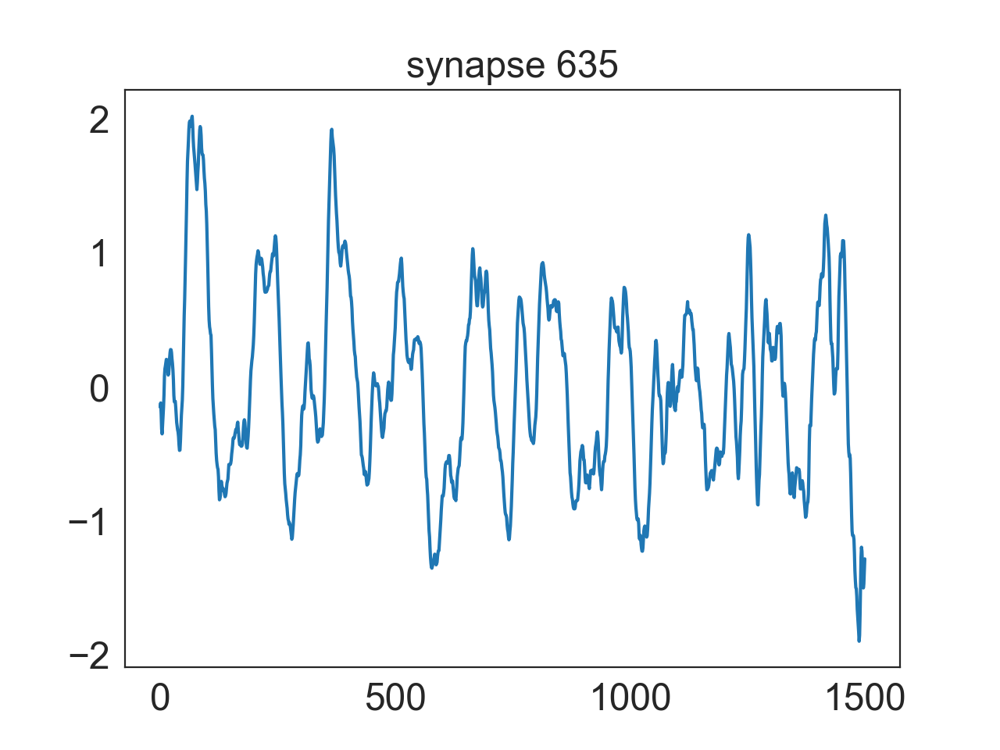

<IPython.core.display.Javascript object>


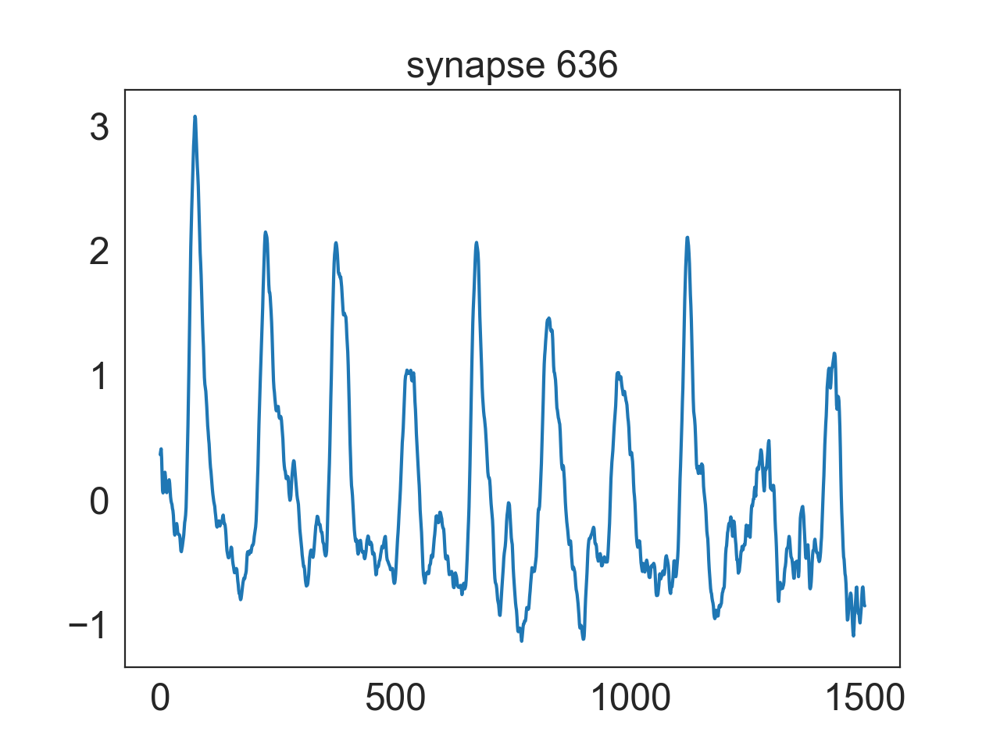

<IPython.core.display.Javascript object>


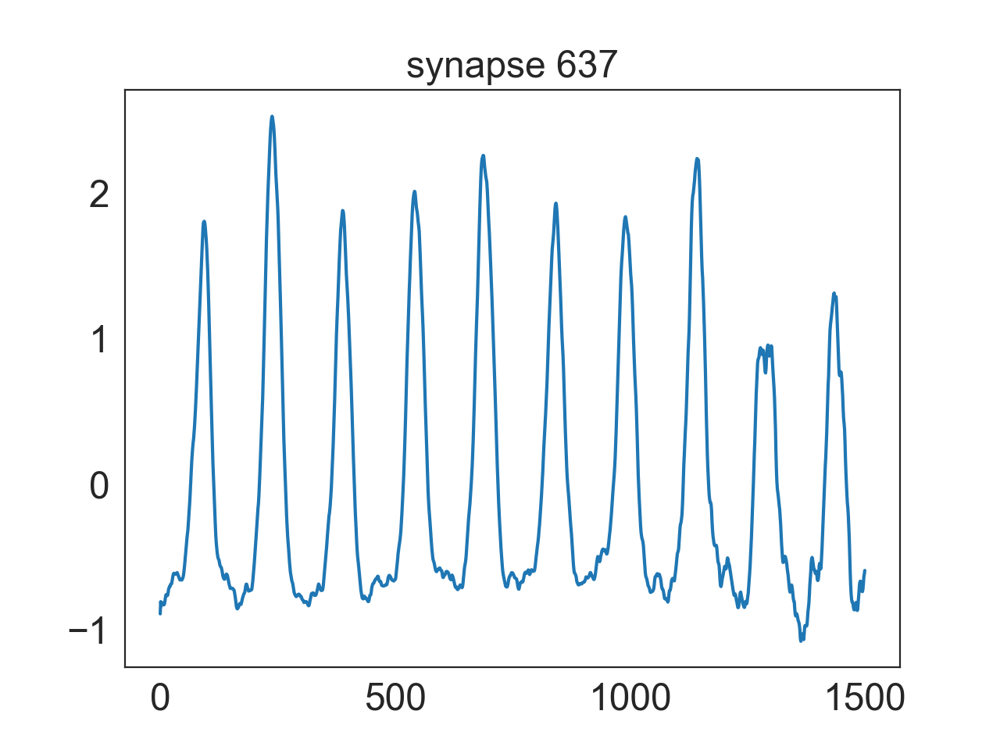

<IPython.core.display.Javascript object>


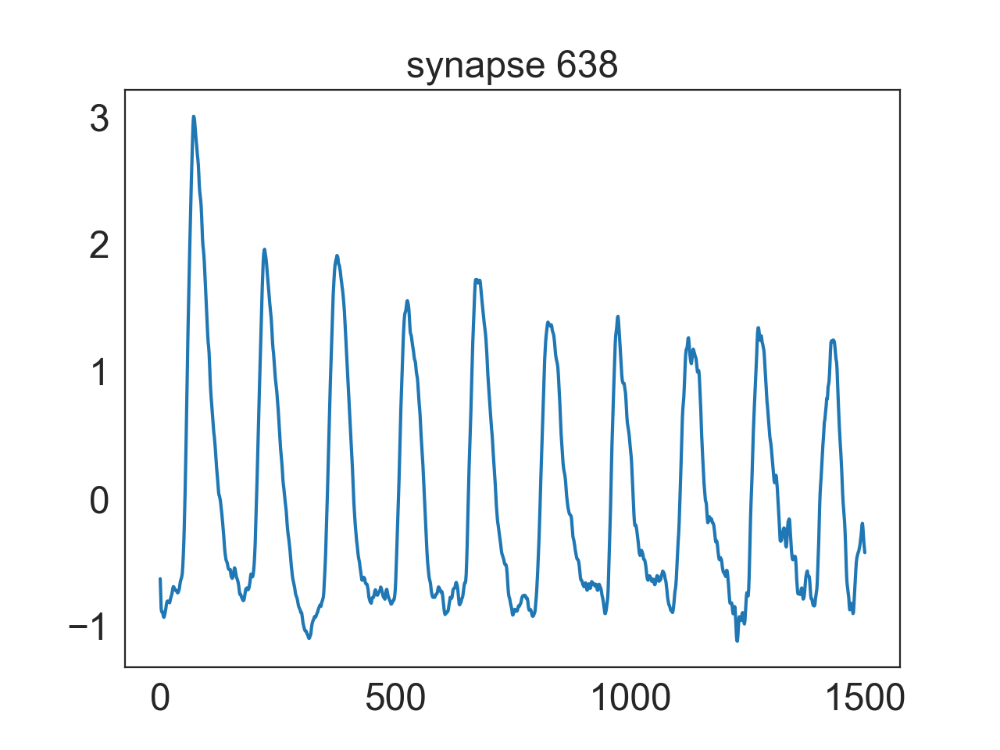

<IPython.core.display.Javascript object>


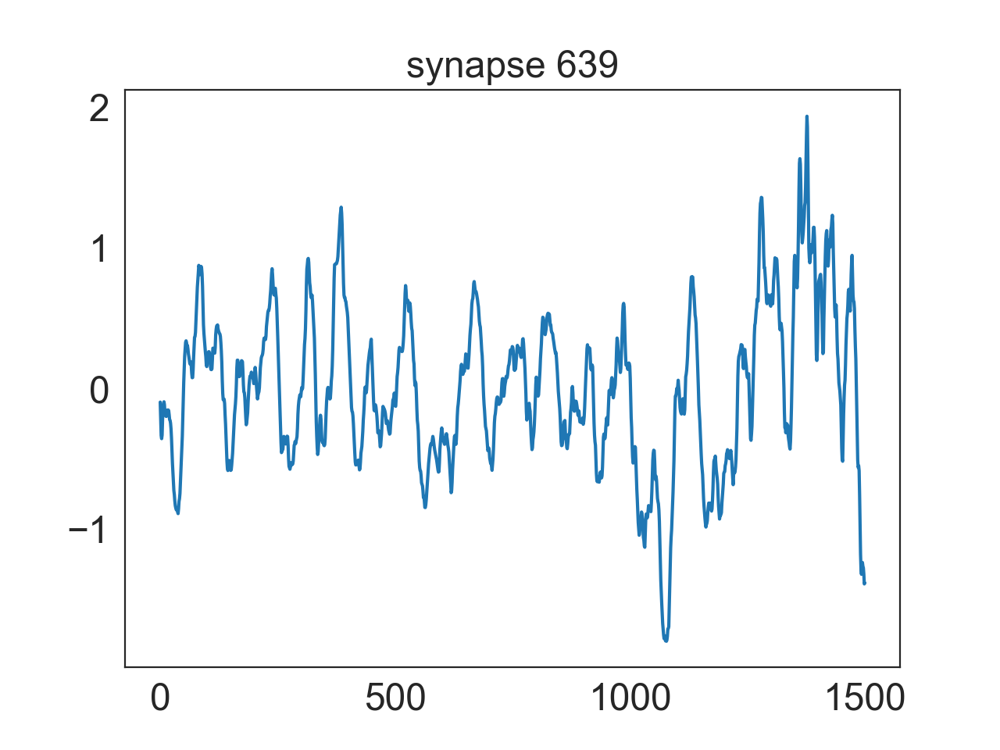

<IPython.core.display.Javascript object>


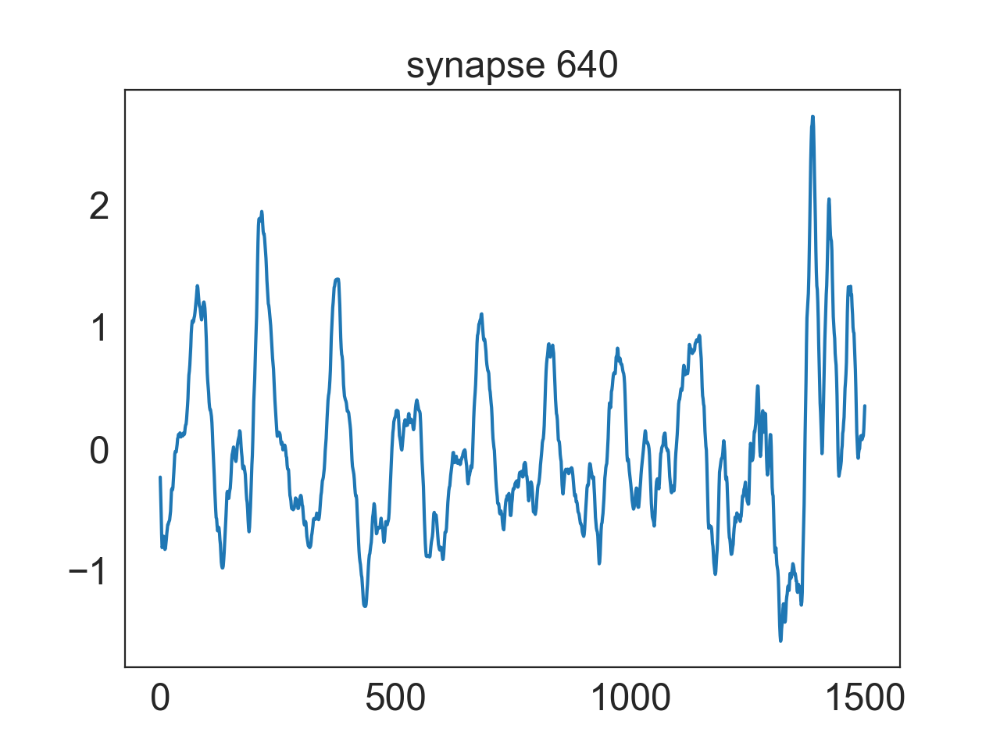

<IPython.core.display.Javascript object>


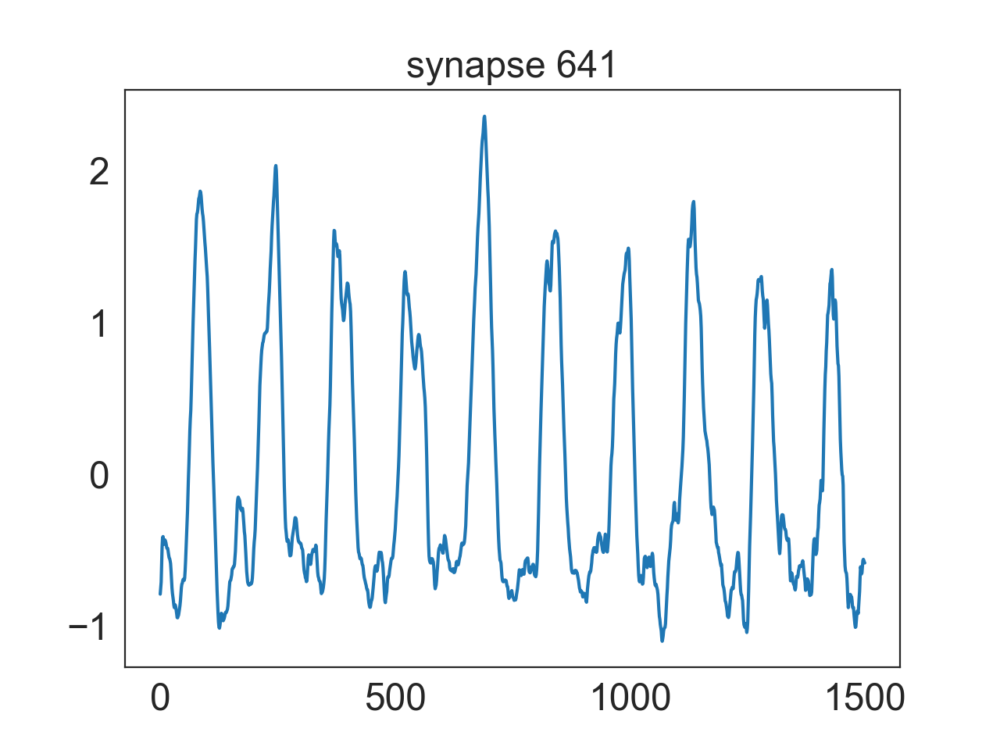

<IPython.core.display.Javascript object>


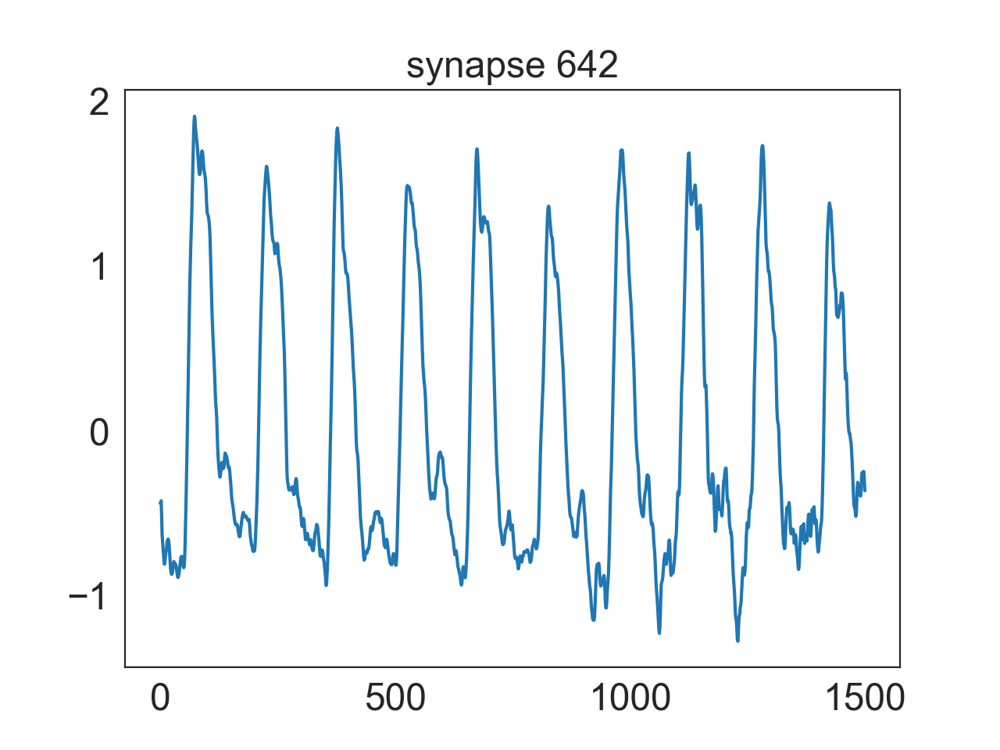

<IPython.core.display.Javascript object>


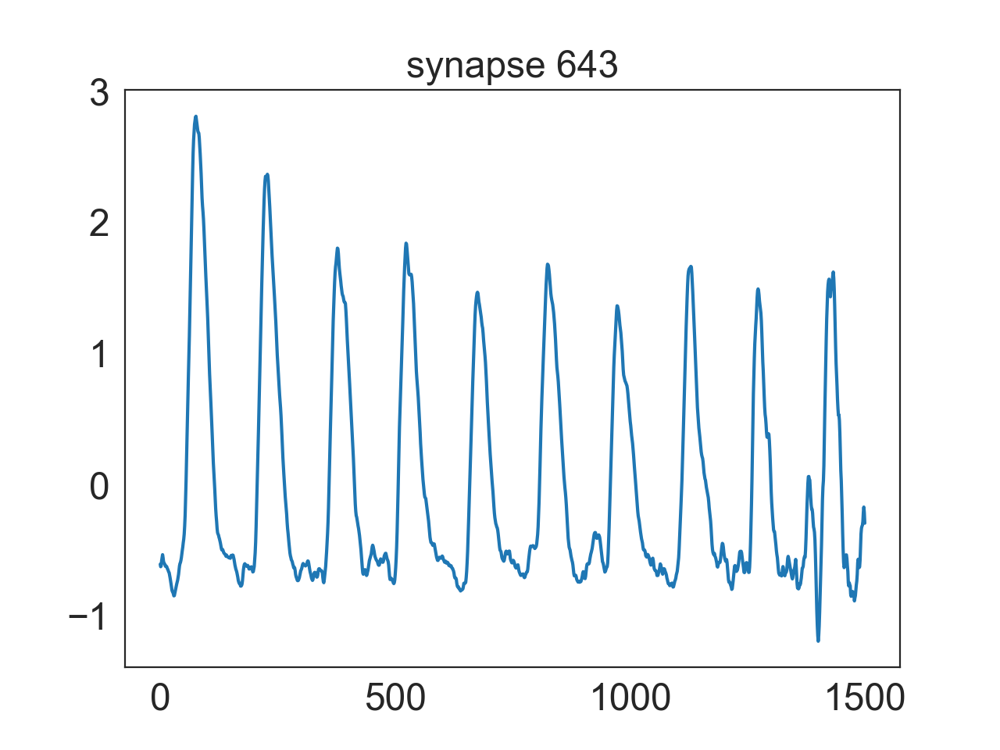

C:\Users\andrew.shelton\AppData\Local\Temp\ipykernel_22520\158343125.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots()


<IPython.core.display.Javascript object>


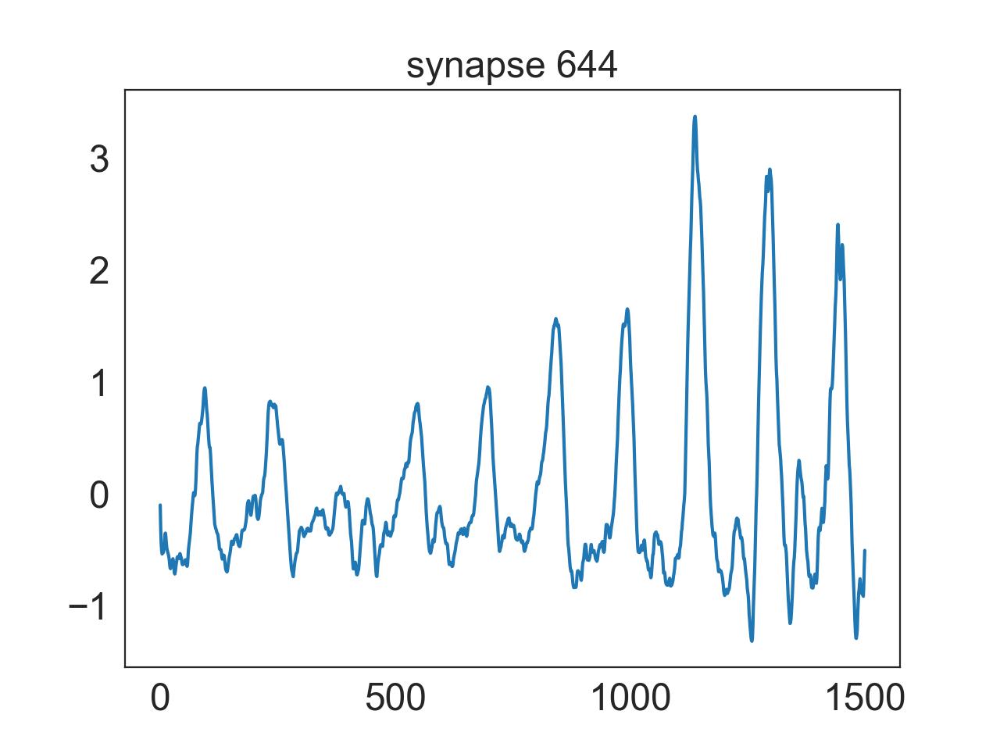

<IPython.core.display.Javascript object>


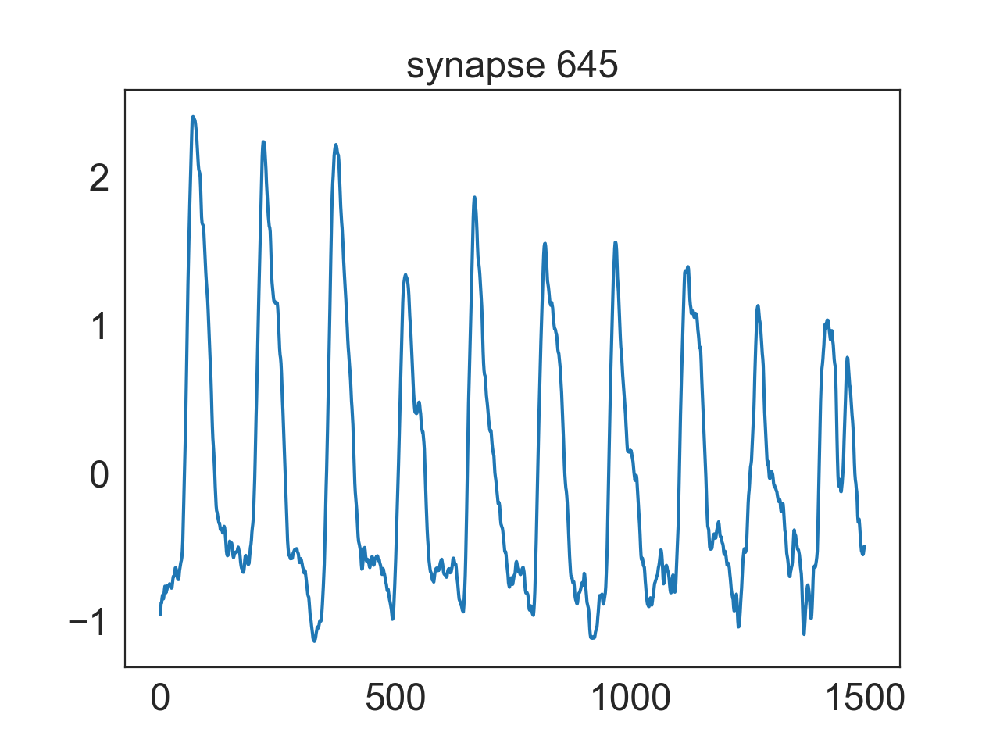

<IPython.core.display.Javascript object>


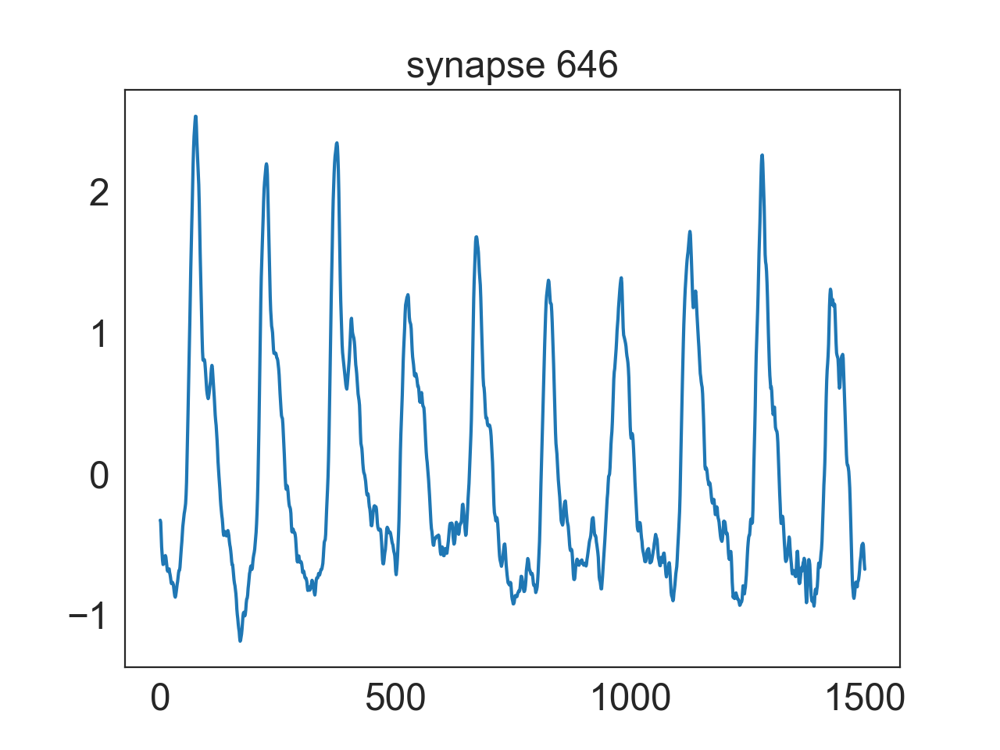

<IPython.core.display.Javascript object>


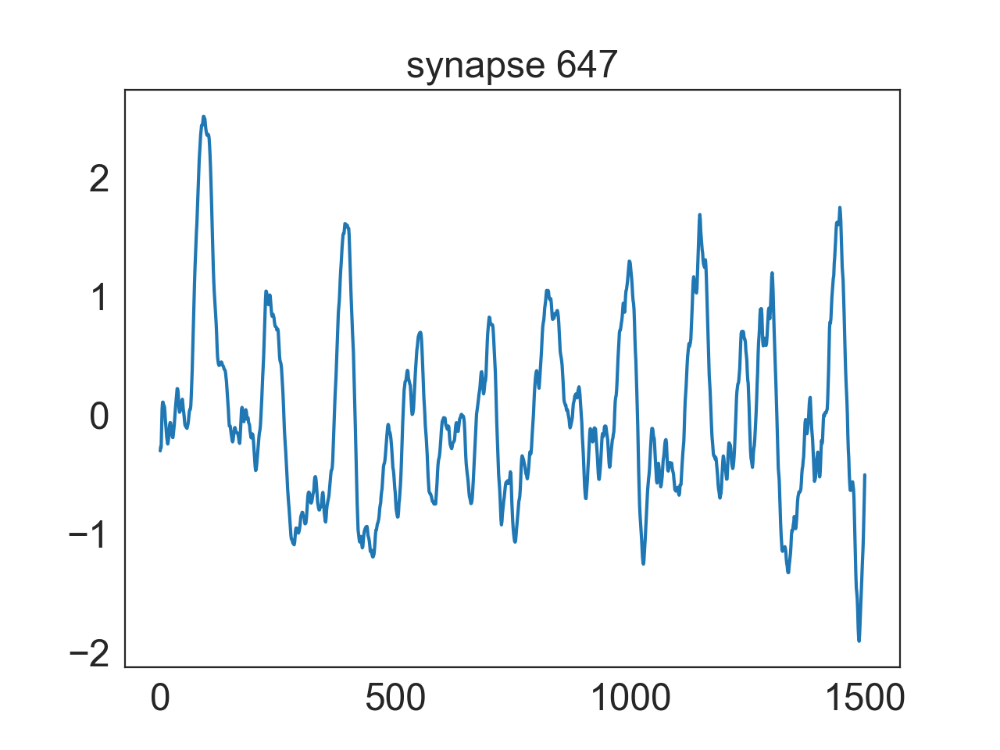

<IPython.core.display.Javascript object>


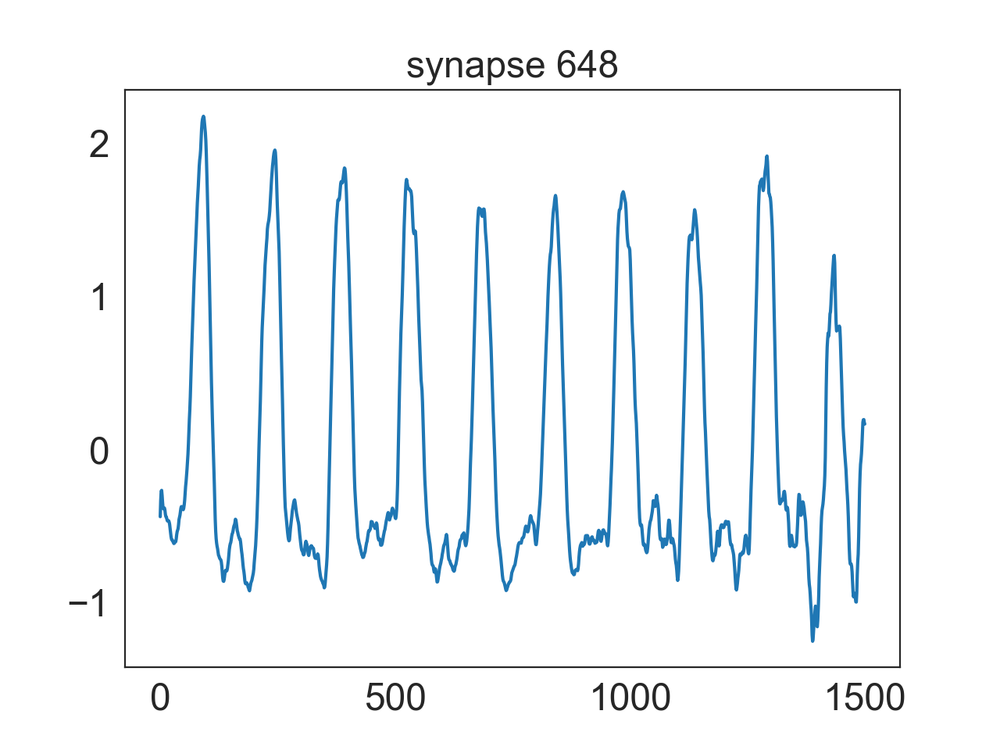

<IPython.core.display.Javascript object>


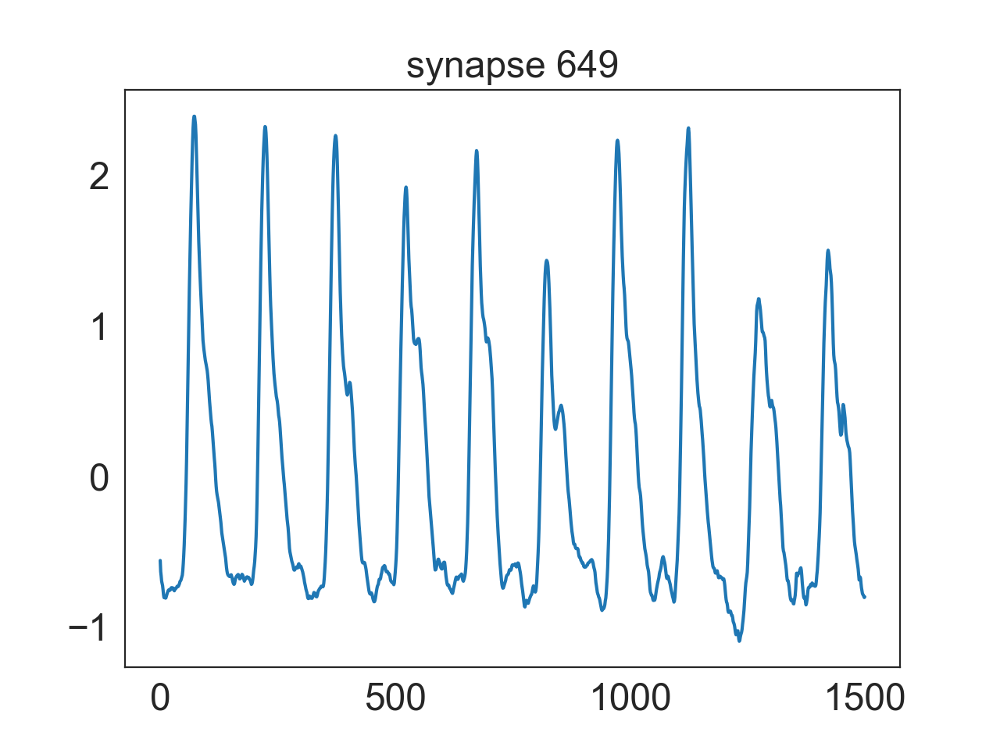

In [15]:
#55, 630, 664
start = 625
end = 25
for i,s in enumerate(preferred_sequence_heatmap_vis_sorted[start:start+end]):
    fig,ax=plt.subplots()

    ax.plot(s)
    ax.set_title(f'synapse {i+start}')

<IPython.core.display.Javascript object>


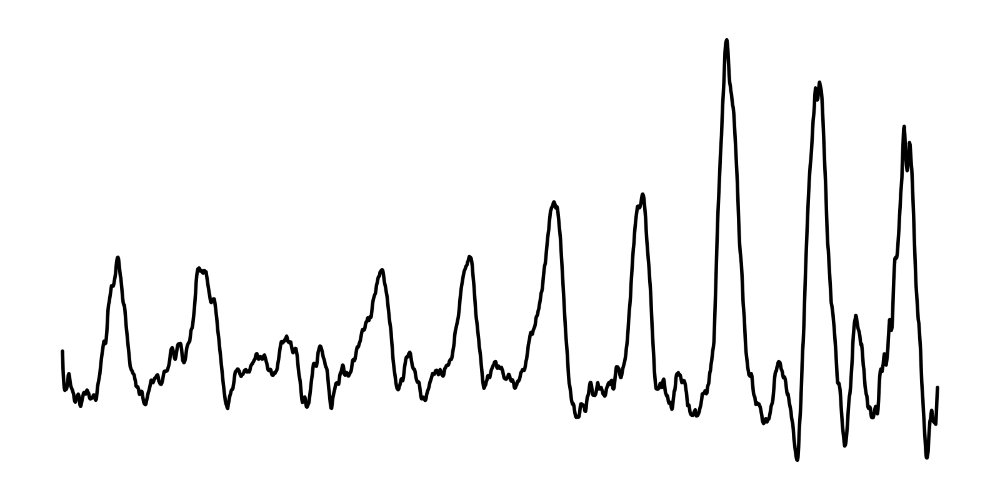

In [16]:
#1204
syn = 644
fig,ax=plt.subplots(figsize=(8,4))
sns.despine(left=True,bottom=True)
ax.set_xticks([])
ax.set_yticks([])
ax.plot(preferred_sequence_heatmap_vis_sorted[syn],lw=2,color='k')
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)
fig.tight_layout()
filen = 'facilitating_heatmap_example'
save_figure(fig,os.path.join(savepath,filen),formats=['.pdf','.png'],dpi=300)